In [1]:
import cabi.viz as viz
import cabi.etl.load as l
import cabi.etl.transform as t
import cabi.geometry as geo
import requests
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import contextily as ctx
from functools import partial
from cabi.etl import config
from cabi.etl.extract import anc_gdf

In [2]:
import geoplot

In [2]:
plus_minus = l.load_counts_full()
plus_minus

,2F,1A,5E,2A,6C,1B,4B,3C,2B,6B,...,5C,7E,4A,3G,3D,7B,8D,8B,7C,2D
time,,,,,,,,,,,,,,,,,,,,,
2020-04-01 00:25:48,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-04-01 00:27:59,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-04-01 01:36:09,-1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-04-01 01:39:17,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-04-01 01:47:36,0,-1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-08-01 01:52:27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-08-01 01:56:45,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-08-01 02:50:22,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
plus_minus['2F'].head(40)

time
2020-04-01 00:25:48    0
2020-04-01 00:27:59    0
2020-04-01 01:36:09   -1
2020-04-01 01:39:17    1
2020-04-01 01:47:36    0
2020-04-01 01:59:15    0
2020-04-01 02:09:11    0
2020-04-01 02:49:12    0
2020-04-01 03:13:20    0
2020-04-01 03:15:58    0
2020-04-01 03:27:00    0
2020-04-01 03:47:29    0
2020-04-01 04:23:18    0
2020-04-01 04:36:09    0
2020-04-01 04:38:00   -1
2020-04-01 04:42:18    0
2020-04-01 04:48:14    0
2020-04-01 04:48:27   -1
2020-04-01 04:53:34    0
2020-04-01 04:54:08    0
2020-04-01 04:56:58    0
2020-04-01 05:03:39    1
2020-04-01 05:06:55    0
2020-04-01 05:18:20    0
2020-04-01 05:26:56   -1
2020-04-01 05:28:27    0
2020-04-01 05:29:01    0
2020-04-01 05:34:03    0
2020-04-01 05:34:38    0
2020-04-01 05:37:04    0
2020-04-01 05:37:04    0
2020-04-01 05:38:24    1
2020-04-01 05:40:17    0
2020-04-01 05:52:59    0
2020-04-01 05:55:29    0
2020-04-01 05:56:44    0
2020-04-01 05:59:34    0
2020-04-01 06:02:15    0
2020-04-01 06:05:52   -1
2020-04-01 06:06:48 

In [50]:
def in_outs(window, col, in_out='both'):
    """counts number of values in a given window for each value present in col
    since col vals are 0,-1,1 we can just return -1,1 to see checkouts/ins"""
    dummied = pd.get_dummies(plus_minus[col]).rolling(window).sum()
#     return dummied.columns
    if in_out == 'both':
        result = dummied[[1, -1]]
    elif in_out == 'out':
        result = dummied[-1]
    elif in_out == 'in':
        result = dummied[1]
    else:
        result = None
    return result

# in_outs('2F', '6H', in_out='out').head(50)
    
    
def outs(window, col):
    dummied = pd.get_dummies(plus_minus[col]).rolling(window).sum()
    dummied.columns = dummied.columns.astype('str')
    dummied.rename(columns={'-1':col})
    return dummied.columns

# outs('2F', '6H')

three_hour_outs = partial(outs, '3H')

In [51]:
three_hour_checkouts = pd.concat([outs(x, '3H') for x in plus_minus.columns])

three_hour_checkouts

KeyError: '3H'

In [52]:
three_hour_checks_2F = three_hour_outs('2F')

In [53]:
three_hour_checks_2F

Index(['-1', '0', '1'], dtype='object')

In [3]:
long_geo = l.load_trips()
long_geo

AttributeError: module 'geopandas' has no attribute 'read_sql'

TypeError: Input must be valid geometry objects: 0101000020E61000006C09F9A0674353C0CBA145B6F36D4340

In [4]:
conn = config.connection_params()
import sqlalchemy

In [45]:
engine = sqlalchemy.create_engine(conn)

In [46]:
long_geo = gpd.read_postgis("SELECT * FROM trips_long", con=engine.connect(), geom_col='geom_coord')
engine.dispose()

In [47]:
long_geo

,time,ride_id,start_end,duration_seconds,rideable_type,member_casual,ANC,station_name,geom_coord
0,2020-04-01 00:25:48,4B5CEB51ACB3FFD5,start,131.0,docked_bike,member,Outside,Eads St & 15th St S,POINT (-77.05320 38.85900)
1,2020-04-01 00:27:59,4B5CEB51ACB3FFD5,end,131.0,docked_bike,member,Outside,Eads St & 12th St S,POINT (-77.05430 38.86280)
2,2020-04-01 01:36:09,1AF6FB400919CFB9,start,188.0,docked_bike,member,2F,14th & Rhode Island Ave NW,POINT (-77.03230 38.90860)
3,2020-04-01 01:39:17,1AF6FB400919CFB9,end,188.0,docked_bike,member,2F,12th & L St NW,POINT (-77.02840 38.90380)
4,2020-04-01 01:47:36,756AD339589371A3,start,699.0,docked_bike,member,1A,14th & Irving St NW,POINT (-77.03220 38.92860)
...,...,...,...,...,...,...,...,...,...
1319549,2020-08-01 01:52:27,0C79916883F5FFA0,end,9408.0,docked_bike,casual,2C,10th St & Constitution Ave NW,POINT (-77.02601 38.89303)
1319550,2020-08-01 01:56:45,AC57E5DE2CFBAA8C,end,7272.0,docked_bike,casual,2E,34th & Water St NW,POINT (-77.06753 38.90373)
1319551,2020-08-01 02:50:22,31D02200D90B2080,end,14246.0,docked_bike,member,6D,10th St & L'Enfant Plaza SW,POINT (-77.02601 38.88432)
1319552,2020-08-01 02:50:28,FB8EB8CEE291D003,end,13371.0,docked_bike,casual,6D,10th St & L'Enfant Plaza SW,POINT (-77.02601 38.88432)


In [48]:
long_geo = long_geo.set_index('time')
# long_geo = long_geo.set_crs("EPSG:4326")
# long_geo = long_geo.to_crs(epsg=3857)
long_geo

,ride_id,start_end,duration_seconds,rideable_type,member_casual,ANC,station_name,geom_coord
time,,,,,,,,
2020-04-01 00:25:48,4B5CEB51ACB3FFD5,start,131.0,docked_bike,member,Outside,Eads St & 15th St S,POINT (-77.05320 38.85900)
2020-04-01 00:27:59,4B5CEB51ACB3FFD5,end,131.0,docked_bike,member,Outside,Eads St & 12th St S,POINT (-77.05430 38.86280)
2020-04-01 01:36:09,1AF6FB400919CFB9,start,188.0,docked_bike,member,2F,14th & Rhode Island Ave NW,POINT (-77.03230 38.90860)
2020-04-01 01:39:17,1AF6FB400919CFB9,end,188.0,docked_bike,member,2F,12th & L St NW,POINT (-77.02840 38.90380)
2020-04-01 01:47:36,756AD339589371A3,start,699.0,docked_bike,member,1A,14th & Irving St NW,POINT (-77.03220 38.92860)
...,...,...,...,...,...,...,...,...
2020-08-01 01:52:27,0C79916883F5FFA0,end,9408.0,docked_bike,casual,2C,10th St & Constitution Ave NW,POINT (-77.02601 38.89303)
2020-08-01 01:56:45,AC57E5DE2CFBAA8C,end,7272.0,docked_bike,casual,2E,34th & Water St NW,POINT (-77.06753 38.90373)
2020-08-01 02:50:22,31D02200D90B2080,end,14246.0,docked_bike,member,6D,10th St & L'Enfant Plaza SW,POINT (-77.02601 38.88432)


In [71]:
from cabi.etl.extract import load_dc_boundary
dc_area = gpd.GeoDataFrame.from_features(load_dc_boundary()['features'])
dc_area

,geometry,OBJECTID,CITY_NAME,STATE_CITY,CAPITAL,WEB_URL,AREAKM,AREAMILES,Shape_Length,Shape_Area
0,"POLYGON ((-77.11980 38.93435, -77.11979 38.934...",1,Washington,1150000,Y,http://www.dc.gov,177.47,68.52,67608.276922,1.774562e+08


<AxesSubplot:>

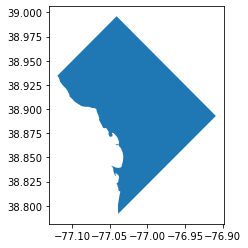

In [72]:
dc_area = dc_area.set_crs("EPSG:4326")
dc_area.plot()

In [42]:
import numpy as np
import scipy.stats
import seaborn.palettes
import seaborn.utils

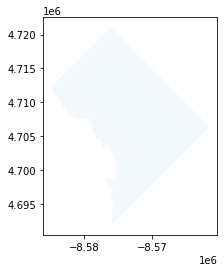

In [44]:
dc_area = dc_area.set_crs("EPSG:4326")
lat_lng_bounds = dc_area.total_bounds
area = dc_area.to_crs(epsg=3857)
axis = area.total_bounds
ax = area.plot(alpha=0.05)
dc_area.

In [ ]:
# def add_basemap(ax, latlng_bounds, axis, url='https://a.basemaps.cartocdn.com/light_all/tileZ/tileX/tileY@2x.png'):
#     prev_ax = ax.axis()
#     # TODO: Zoom should surely take output pixel request size into account...
#     zoom = ctx.tile._calculate_zoom(*latlng_bounds)
#     while ctx.tile.howmany(*latlng_bounds, zoom, ll=True) > max_tiles:      # dont ever try to download loads of tiles
#         zoom = zoom - 1
#     print("downloading %d tiles with zoom level %d" % (ctx.tile.howmany(*latlng_bounds, zoom, ll=True), zoom))
#     basemap, extent = ctx.bounds2img(*axis, zoom=zoom, url=url)
#     ax.imshow(basemap, extent=extent, interpolation='bilinear')
#     ax.axis(prev_ax)        # restore axis after changing the background
 
# add_basemap(ax, latlng_bounds, axis)

In [139]:
am79_trips = long_geo.between_time('07:00', '11:00')
am79_ends = am79_trips[(am79_trips.start_end == 'end') & (am79_trips.ANC != 'Outside')]
am79_starts = am79_trips[(am79_trips.start_end == 'start') & (am79_trips.ANC != 'Outside')]
am79_starts_wday = am79_starts[am79_starts.index.weekday < 5]
am79_starts_weekend = am79_starts[am79_starts.index.weekday > 4]
am79_ends_wday = am79_ends[am79_ends.index.weekday < 5]
am79_ends_weekend = am79_ends[am79_ends.index.weekday > 4]

# am911_trips = long_geo.between_time('09:00', '11:00')
# am911_ends = am911_trips[(am911_trips.start_end == 'end') & (am911_trips.ANC != 'Outside')]
# am911_starts = am911_trips[(am911_trips.start_end == 'start') & (am911_trips.ANC != 'Outside')]
# am911_starts_wday = am911_starts[am911_starts.index.weekday < 5]
# am911_starts_weekend = am911_starts[am911_starts.index.weekday > 4]
# am911_ends_wday = am911_ends[am911_ends.index.weekday < 5]
# am911_ends_weekend = am911_ends[am911_ends.index.weekday > 4]



# pm46_trips = long_geo.between_time('16:00', '18:00')
# pm46_ends = pm46_trips[(pm46_trips.start_end == 'end') & (pm46_trips.ANC != 'Outside')]
# pm46_starts = pm46_trips[(pm46_trips.start_end == 'start') & (pm46_trips.ANC != 'Outside')]
# pm46_starts_wday = pm46_starts[pm46_starts.index.weekday < 5]
# pm46_starts_weekend = pm46_starts[pm46_starts.index.weekday > 4]
# pm46_ends_wday = pm46_ends[pm46_ends.index.weekday < 5]
# pm46_ends_weekend = pm46_ends[pm46_ends.index.weekday > 4]


pm68_trips = long_geo.between_time('16:00', '20:00')
pm68_ends = pm68_trips[(pm68_trips.start_end == 'end') & (pm68_trips.ANC != 'Outside')]
pm68_starts = pm68_trips[(pm68_trips.start_end == 'start') & (pm68_trips.ANC != 'Outside')]
pm68_starts_wday = pm68_starts[pm68_starts.index.weekday < 5]
pm68_starts_weekend = pm68_starts[pm68_starts.index.weekday > 4]
pm68_ends_wday = pm68_ends[pm68_ends.index.weekday < 5]
pm68_ends_weekend = pm68_ends[pm68_ends.index.weekday > 4]

In [182]:
midday_trips = long_geo.between_time('11:00', '16:00')
midday_ends = midday_trips[(midday_trips.start_end == 'end') & (midday_trips.ANC != 'Outside')]
midday_starts = midday_trips[(midday_trips.start_end == 'start') & (midday_trips.ANC != 'Outside')]
midday_starts_wday = midday_starts[midday_starts.index.weekday < 5]
midday_starts_weekend = midday_starts[midday_starts.index.weekday > 4]
midday_ends_wday = midday_ends[midday_ends.index.weekday < 5]
midday_ends_weekend = midday_ends[midday_ends.index.weekday > 4]

In [105]:
am79_starts.index.weekday

Int64Index([2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
            ...
            4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
           dtype='int64', name='time', length=35082)

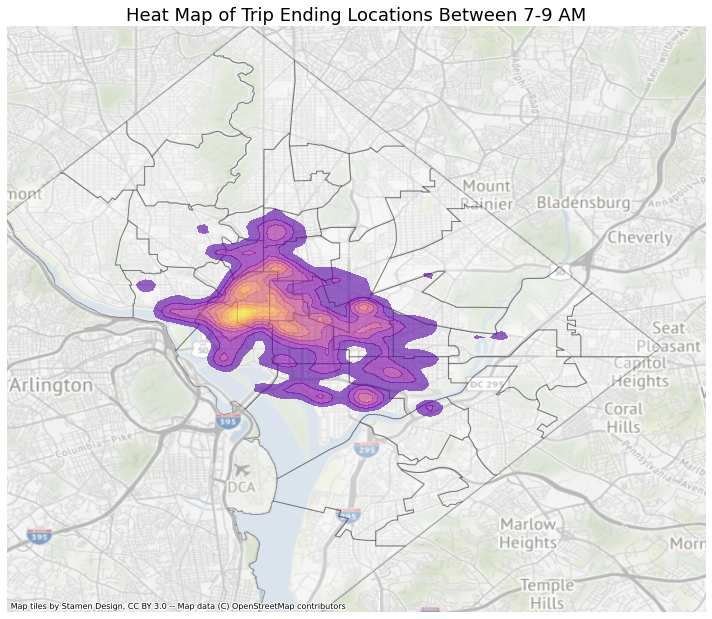

In [130]:
ctx_gdf = anc_gdf()
ctx_gdf = ctx_gdf.set_crs("EPSG:4326")
# ctx_gdf = ctx_gdf.to_crs(epsg=3857)
# cmap = {anc: 'blue' if anc in bot_five else 'red' if anc in top_five else 'grey' for anc in ctx_gdf['ANC_ID']}

# ctx_gdf['color'] = ctx.ANC_ID.map(lambda x: )

fig, ax = plt.subplots(figsize=(10,12))
ctx_gdf.plot(figsize=(10, 10), alpha=0.3, color='white', edgecolor='k', ax=ax)
# geoplot.kdeplot(am79_ends, cmap='PuRd', shade=True, ax=ax, alpha=0.7)
geoplot.kdeplot(pm46_ends_wday, cmap='plasma', shade=True, ax=ax, alpha=0.6)
ax.set_aspect('equal')
# ax.margins(-0.4, -0.4)
# ax.set_xlim(ax.get_xlim()[0] + 0.25, ax.get_xlim()[1])
# ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[1]-0.2)
ctx.add_basemap(ax, alpha=0.5, crs=ctx_gdf.crs.to_string())
ax.set_title('Heat Map of Trip Ending Locations Between 7-9 AM', fontsize=18)
ax.set(xticks=[], yticks=[])
fig.tight_layout()
plt.show();

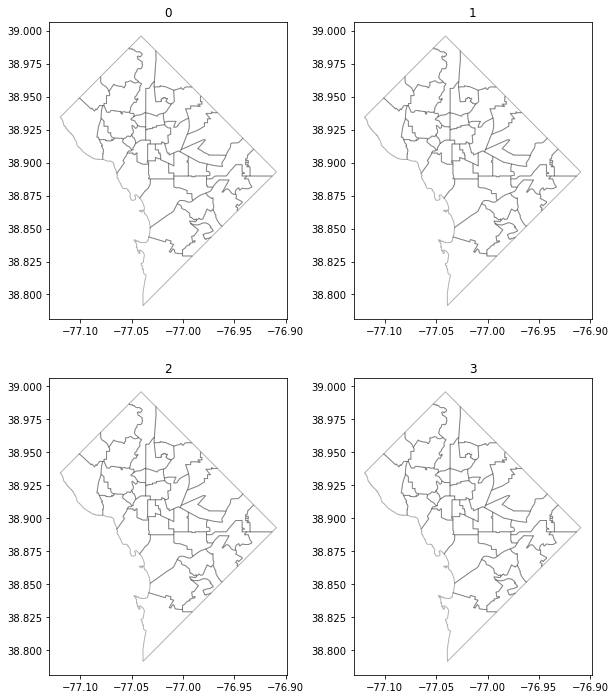

In [194]:
fig, ((ax, ax1), (ax2, ax3)) = plt.subplots(2,2, figsize=(10,12))


n=0
for axe in [ax, ax1, ax2, ax3]:
    ctx_gdf.plot(figsize=(10, 10), alpha=0.3, color='white', edgecolor='k', ax=axe)
    axe.set_title(n)
    n +=1


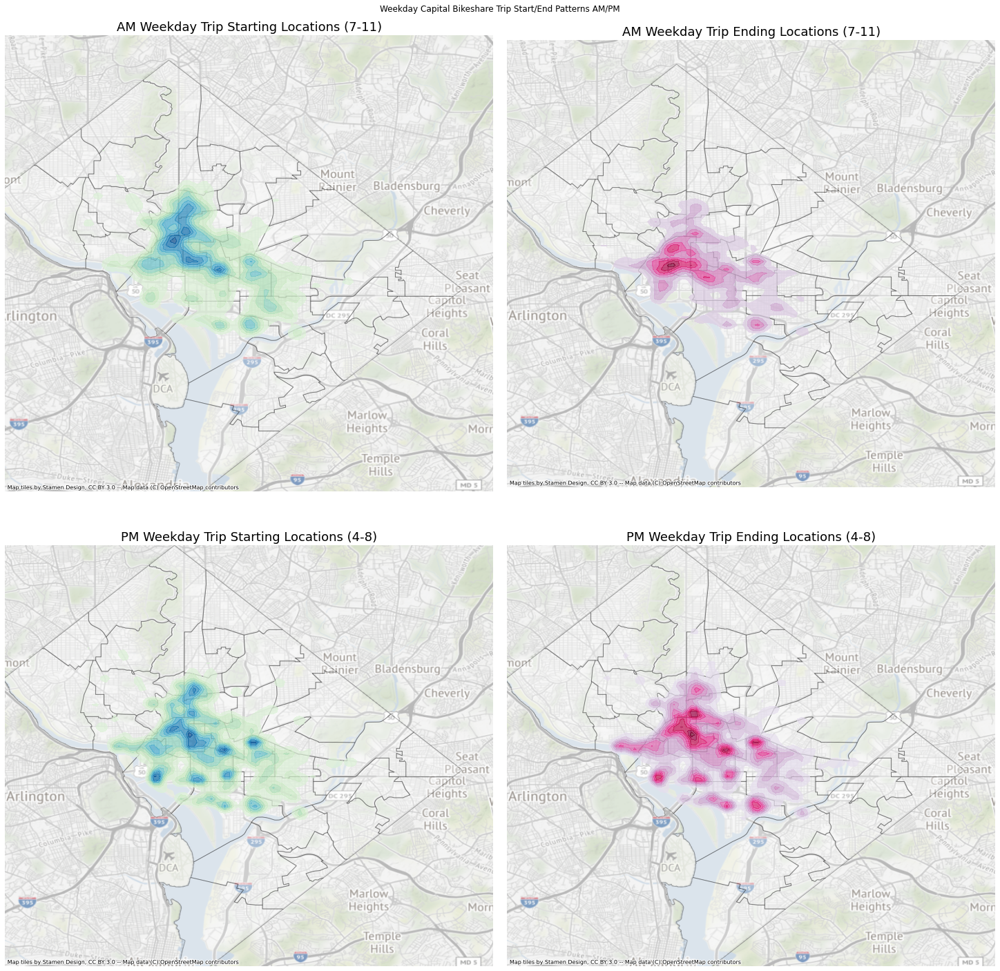

In [177]:
# Create dict of titles as keys and dfs as values
plot_dict = {'AM Weekday Trip Starting Locations (7-11)': am79_starts_wday,
             'AM Weekday Trip Ending Locations (7-11)': am79_ends_wday,
             'PM Weekday Trip Starting Locations (4-8)': pm68_starts_wday,
             'PM Weekday Trip Ending Locations (4-8)': pm68_ends_wday,}

ax_list = (ax, ax1, ax2, ax3)

fig, ((ax, ax1), (ax2, ax3)) = plt.subplots(2,2, figsize=(20,20), constrained_layout=True)

cmap_dict = {'AM Weekday Trip Starting Locations (7-11)': 'GnBu',
             'AM Weekday Trip Ending Locations (7-11)': 'PuRd',
             'PM Weekday Trip Starting Locations (4-8)': 'GnBu',
             'PM Weekday Trip Ending Locations (4-8)': 'PuRd'
            }

for key, axe in zip(plot_dict.keys(), [ax, ax1, ax2, ax3]):
    ctx_gdf.plot(figsize=(10, 10), alpha=0.3, color='white', edgecolor='k', ax=axe)
    geoplot.kdeplot(plot_dict[key], cmap=cmap_dict[key] , shade=True, ax=axe, alpha=0.7)
    ctx.add_basemap(axe, alpha=0.5, crs=ctx_gdf.crs.to_string())
    axe.set_title(key, fontsize=18)
    axe.set(xticks=[], yticks=[])
    axe.set_aspect('equal')

fig.suptitle('Weekday Capital Bikeshare Trip Start/End Patterns AM/PM')


plt.show();



In [178]:
fig.savefig('../figures/weekdayhmap.png')

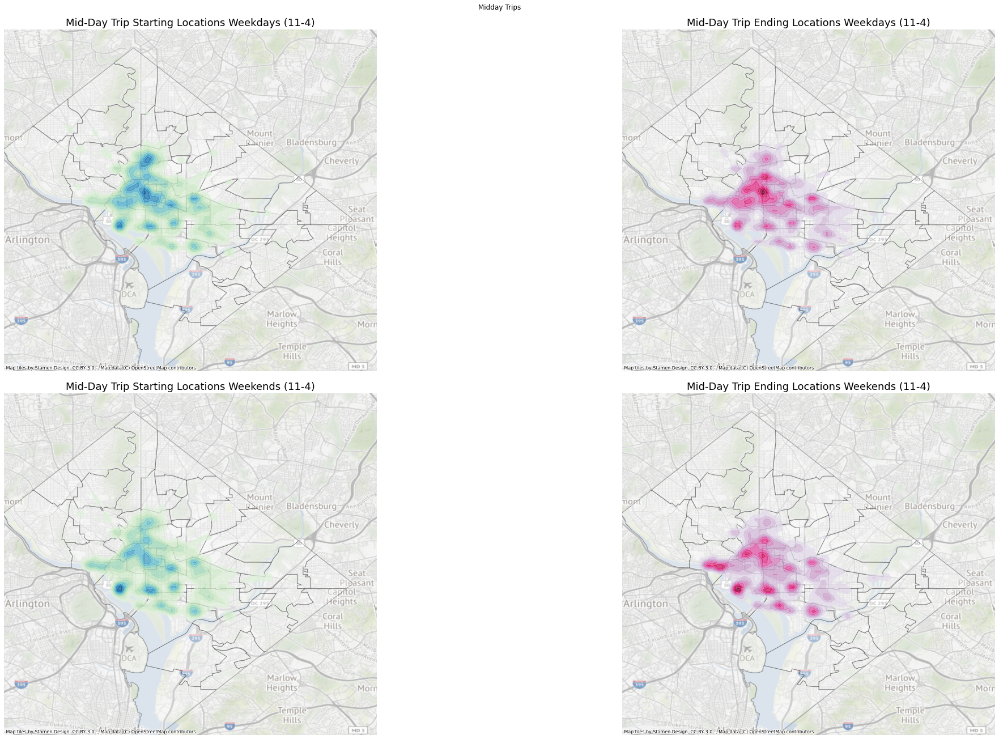

In [184]:
# Create dict of titles as keys and dfs as values
plot_dict = {'Mid-Day Trip Starting Locations Weekdays (11-4)': midday_starts_wday,
             'Mid-Day Trip Ending Locations Weekdays (11-4)': midday_ends_wday,
             'Mid-Day Trip Starting Locations Weekends (11-4)': midday_starts_weekend,
             'Mid-Day Trip Ending Locations Weekends (11-4)': midday_ends_weekend,}

ax_list = (ax, ax1, ax2, ax3)

fig2, ((ax, ax1), (ax2, ax3)) = plt.subplots(2,2, figsize=(30,18), constrained_layout=True)

cmap_dict = {'Mid-Day Trip Starting Locations Weekdays (11-4)': 'GnBu',
             'Mid-Day Trip Ending Locations Weekdays (11-4)': 'PuRd',
             'Mid-Day Trip Starting Locations Weekends (11-4)': 'GnBu',
             'Mid-Day Trip Ending Locations Weekends (11-4)': 'PuRd'
            }

for key, axe in zip(plot_dict.keys(), [ax, ax1, ax2, ax3]):
    ctx_gdf.plot(figsize=(10, 10), alpha=0.3, color='white', edgecolor='k', ax=axe)
    geoplot.kdeplot(plot_dict[key], cmap=cmap_dict[key] , shade=True, ax=axe, alpha=0.7)
    ctx.add_basemap(axe, alpha=0.5, crs=ctx_gdf.crs.to_string())
    axe.set_title(key, fontsize=18)
    axe.set(xticks=[], yticks=[])
    axe.set_aspect('equal')

# fig2.suptitle('Midday Trips')


plt.show();

fig2.savefig('../figures/midday.png')

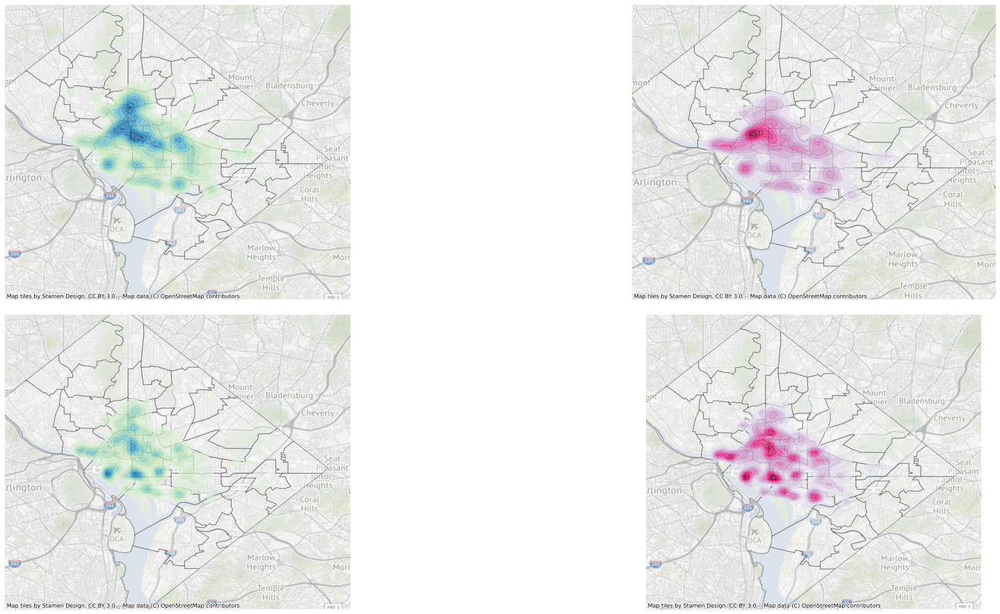

In [193]:
# Create dict of titles as keys and dfs as values
plot_dict = {'AM Weekend Trip Starting Locations (7-11)': am79_starts_weekend, 
             'AM Weekend Trip Ending Locations (7-11)': am79_ends_weekend, 
             'PM Weekend Trip Starting Locations (4-8)': pm68_starts_weekend, 
             'PM Weekend Trip Ending Locations (4-8)': pm68_ends_weekend }

ax_list = (ax, ax1, ax2, ax3)

fig1, ((ax, ax1), (ax2, ax3)) = plt.subplots(2,2, figsize=(32,16))

cmap_dict = {'AM Weekend Trip Starting Locations (7-11)': 'GnBu',
             'AM Weekend Trip Ending Locations (7-11)': 'PuRd',
             'PM Weekend Trip Starting Locations (4-8)': 'GnBu',
             'PM Weekend Trip Ending Locations (4-8)': 'PuRd'
            }

for key, axe in zip(plot_dict.keys(), [ax, ax1, ax2, ax3]):
    ctx_gdf.plot(alpha=0.3, color='white', edgecolor='k', ax=axe)
    geoplot.kdeplot(plot_dict[key], cmap=cmap_dict[key] , shade=True, ax=axe, alpha=0.7)
    ctx.add_basemap(axe, alpha=0.5, crs=ctx_gdf.crs.to_string())
#     axe.set_title(key, fontsize=18)
    axe.set(xticks=[], yticks=[])
#     axe.set_aspect('equal')

# fig1.suptitle('Weekend Capital Bikeshare Trip Start/End Patterns AM/PM')

plt.subplots_adjust(left=None, bottom=None, top=None, right=None, wspace=.05, hspace=.05)
plt.show();


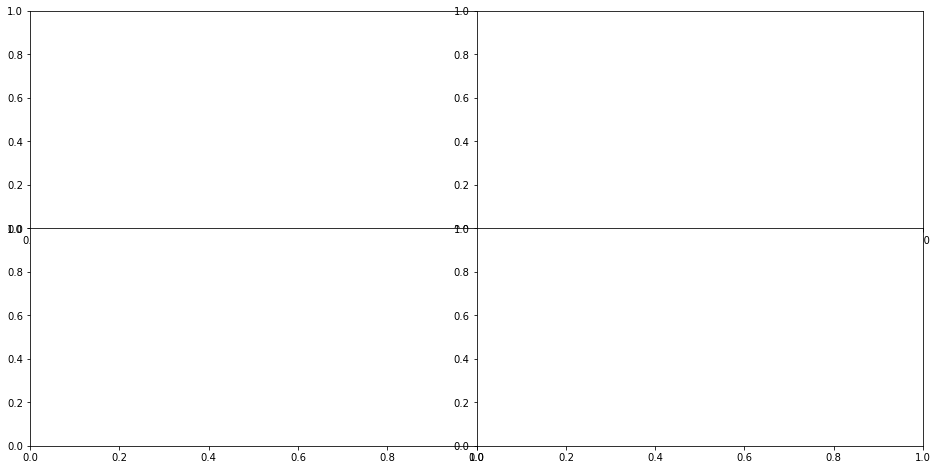

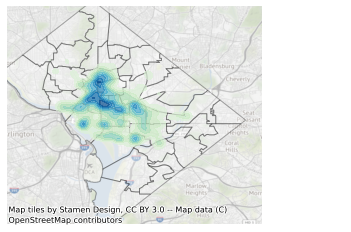

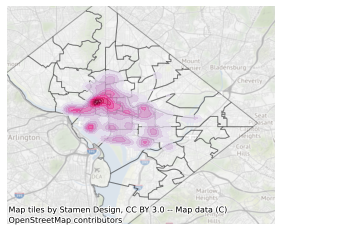

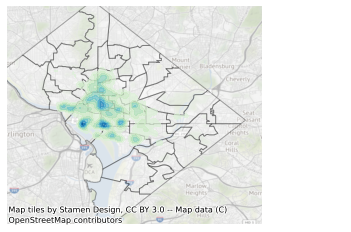

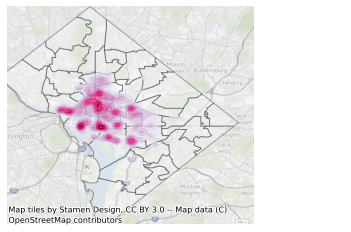

In [199]:
from matplotlib import gridspec

# Create dict of titles as keys and dfs as values
plot_dict = {'AM Weekend Trip Starting Locations (7-11)': am79_starts_weekend, 
             'AM Weekend Trip Ending Locations (7-11)': am79_ends_weekend, 
             'PM Weekend Trip Starting Locations (4-8)': pm68_starts_weekend, 
             'PM Weekend Trip Ending Locations (4-8)': pm68_ends_weekend }





cmap_dict = {'AM Weekend Trip Starting Locations (7-11)': 'GnBu',
             'AM Weekend Trip Ending Locations (7-11)': 'PuRd',
             'PM Weekend Trip Starting Locations (4-8)': 'GnBu',
             'PM Weekend Trip Ending Locations (4-8)': 'PuRd'
            }



fig4 = plt.figure(figsize=(16, 8)) 

gs = gridspec.GridSpec(nrows=2, ncols=2, wspace=0, hspace=0)

ax1 = fig4.add_subplot(gs[0, 0])
ax2 = fig4.add_subplot(gs[0, 1])
ax3 = fig4.add_subplot(gs[1, 0])
ax4 = fig4.add_subplot(gs[1, 1])

for key, axe in zip(plot_dict.keys(), [ax1, ax2, ax3, ax4]):
    axe = ctx_gdf.plot(alpha=0.3, color='white', edgecolor='k')
    geoplot.kdeplot(plot_dict[key], cmap=cmap_dict[key] , shade=True, ax=axe, alpha=0.7)
    ctx.add_basemap(axe, alpha=0.5, crs=ctx_gdf.crs.to_string())
#     axe.set_title(key, fontsize=18)
    axe.set(xticks=[], yticks=[])

plt.show()

In [205]:
dir(fig4)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_add_axes_internal',
 '_agg_filter',
 '_align_xlabel_grp',
 '_align_ylabel_grp',
 '_alpha',
 '_animated',
 '_axobservers',
 '_axstack',
 '_cachedRenderer',
 '_clipon',
 '_clippath',
 '_constrained',
 '_constrained_layout_pads',
 '_contains',
 '_default_contains',
 '_dpi',
 '_gci',
 '_get_clipping_extent_bbox',
 '_get_dpi',
 '_gid',
 '_gridspecs',
 '_in_layout',
 '_label',
 '_layoutbox',
 '_make_key',
 '_mouseover',
 '_normalize_grid_string',
 '_oid',
 '_path_effects',
 '_picker',
 '_process_projection_requirements',
 '_propobservers',
 '_rasterized',
 '_remove_method',
 '_repr_html_',
 '

In [181]:
fig1.savefig('../figures/weekendhmap.png')

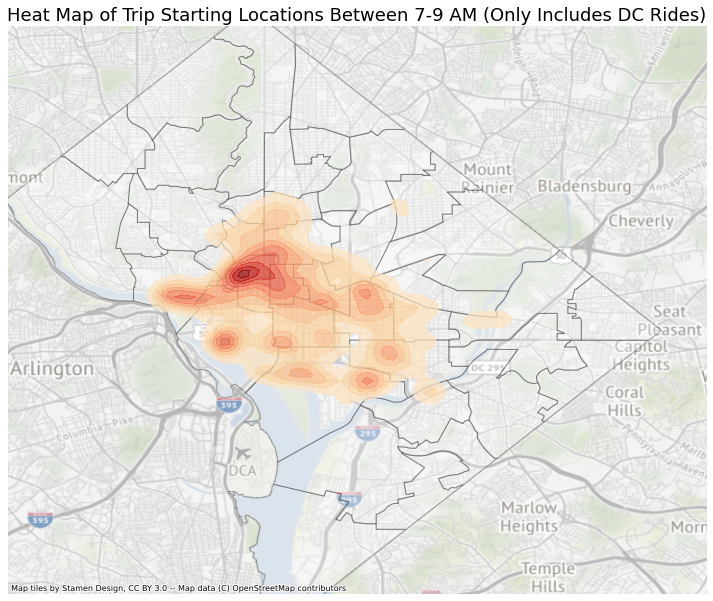

In [138]:
fig, ax = plt.subplots(figsize=(10,12))
ctx_gdf.plot(figsize=(10, 10), alpha=0.3, color='white', edgecolor='k', ax=ax)
geoplot.kdeplot(am911_ends_weekend, cmap='OrRd', shade=True, ax=ax, alpha=0.7)
ax.set_aspect('equal')
# ax.margins(-0.4, -0.4)
# ax.set_xlim(ax.get_xlim()[0] + 0.25, ax.get_xlim()[1])
# ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[1]-0.2)
ctx.add_basemap(ax, alpha=0.5, crs=ctx_gdf.crs.to_string())
ax.set_title('Heat Map of Trip Starting Locations Between 7-9 AM (Only Includes DC Rides)', fontsize=18)
ax.set(xticks=[], yticks=[])
fig.tight_layout()
plt.show();

In [ ]:
fig,axes = 

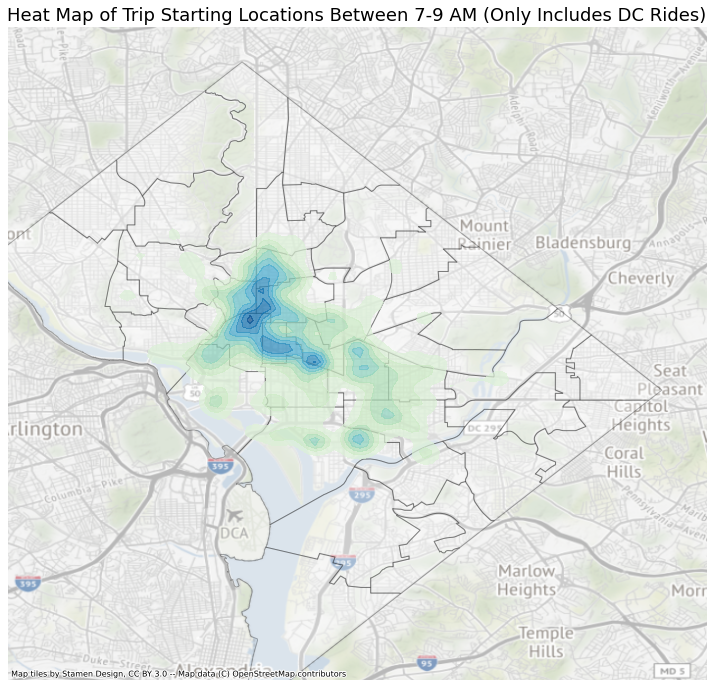

In [86]:
fig, ax = plt.subplots(figsize=(10,12))
ctx_gdf.plot(figsize=(10, 10), alpha=0.3, color='white', edgecolor='k', ax=ax)
geoplot.kdeplot(am79_starts, cmap='GnBu', shade=True, ax=ax, alpha=0.7)
ax.set_aspect('equal')
# ax.margins(-0.4, -0.4)
# ax.set_xlim(ax.get_xlim()[0] + 0.25, ax.get_xlim()[1])
# ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[1]-0.2)
ctx.add_basemap(ax, alpha=0.5, crs=ctx_gdf.crs.to_string())
ax.set_title('Heat Map of Trip Starting Locations Between 7-9 AM (Only Includes DC Rides)', fontsize=18)
ax.set(xticks=[], yticks=[])
fig.tight_layout()
plt.show();

In [ ]:
fig, ax = plt.subplots(figsize=(10,12))
ctx_gdf.plot(figsize=(10, 10), alpha=0.3, color='white', edgecolor='k', ax=ax)
geoplot.kdeplot(am79_starts, cmap='GnBu', shade=True, ax=ax, alpha=0.7)
ax.set_aspect('equal')
# ax.margins(-0.4, -0.4)
# ax.set_xlim(ax.get_xlim()[0] + 0.25, ax.get_xlim()[1])
# ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[1]-0.2)
ctx.add_basemap(ax, alpha=0.5, crs=ctx_gdf.crs.to_string())
ax.set_title('Heat Map of Trip Starting Locations Between 4-6 PM (Only Includes DC Rides)', fontsize=18)
ax.set(xticks=[], yticks=[])
fig.tight_layout()
plt.show();

In [69]:
ax.get_ylim()

(38.7485087, 39.998)

In [67]:
ax.get_ylim()[1] - ax.get_ylim()[0]

0.40909560000000056

In [61]:
ax.get_xlim()[1]

-76.7712084

In [65]:
dir(ax)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_add_text',
 '_adjustable',
 '_agg_filter',
 '_alias_map',
 '_alpha',
 '_anchor',
 '_animated',
 '_aspect',
 '_autoscaleXon',
 '_autoscaleYon',
 '_autotitlepos',
 '_axes',
 '_axes_class',
 '_axes_locator',
 '_axisbelow',
 '_box_aspect',
 '_clipon',
 '_clippath',
 '_contains',
 '_convert_dx',
 '_current_image',
 '_default_contains',
 '_facecolor',
 '_fill_between_x_or_y',
 '_frameon',
 '_gci',
 '_gen_axes_patch',
 '_gen_axes_spines',
 '_get_axis_list',
 '_get_axis_map',
 '_get_clipping_extent_bbox',
 '_get_lines',
 '_get_patches_for_fill',
 '_get_view',
 '_gid',
 '_gridOn',
 '_in_layout',